In [ ]:
# Unzip the uploaded data into Google Drive
#!unzip "/content/drive/MyDrive/Wheat-Disease-Classification/wheat-disease-dataset.zip" -d "/content/drive/MyDrive/Wheat-Disease-Classification/"

 # 🌾End-to-end Multi-class Wheat Disease Classification

## 1. Problem Definition:

Identifying the disease of wheat given an image of wheat plant.

The task is to classify wheat images into one of the predefined categories: `healthy or one of several disease types`.<br>
This classification will help in early detection and treatment of diseases, potentially saving crops and improving yield.

## 2. Data:

The data we are using is  from Kaggle's Wheat Plant Diseases dataset:

https://www.kaggle.com/datasets/kushagra3204/wheat-plant-diseases/data

## 3. Evaluation:

To achieve an accuracy close to 90% in predicting whether a wheat plant is healthy or not, and if not healthy, identifying the specific type of disease.

## 4. Features:

Some information about the data.

+ We're dealing with images (unstructured data) so it's probably best we use deep learning.
+ There are 15 different classes we are going to predict.
+ There are around 13,000+ images in the training set.
+ There are around 1000+ images in the validation and test sets, but we will be using the validation set only due to storage limits.

### Content
**Number of Images:** 14,155<br>
**Image Quality:** High-resolution image<br>
**Disease Classes:**<br>
* Aphid [Pest]
* Mite [Pest]
* Stem Fly [Pest]
* Rusts
  * Black Rust / Stem Rust
  * Brown Rust / Leaf Rust
  * Yellow Rust / Stripe Rust
* Smut (Loose, Flag)
* Common Root Rot
* Helminthosporium Leaf Blight / Leaf Blight
* Wheat Blast
* Fusarium head blight / Scab
* Septoria Leaf Blotch
* Spot Blotch
* Tan Spot
* Powdery Mildew

# Preparing Tools

In [1]:
import numpy as np
import matplotlib.pyplot as plt

import os
from pathlib import Path
import random
from PIL import Image
from typing import Tuple, Dict, List
from tqdm.auto import tqdm

import torch
from torch import nn

from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torch.utils.tensorboard import SummaryWriter

# Note: this notebook requires torch >= 1.10.0
torch.__version__

'2.2.1+cu121'

## 0. Setting up device-agnostic code

In [2]:
# Setup device-agnostic code
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device: {device}")

Device: cuda


## 1. Data Preparation

We can inspect what's in our data directory by writing a small helper function to walk through each of the subdirectories and count the files present.

To do so, we'll use Python's in-built `os.walk()`.

In [3]:
# Deleting a non-empty directory -> test folder as we will be dealing with only train and valid sets due to storage limits
#import shutil
#shutil.rmtree('/content/drive/MyDrive/Wheat-Disease-Classification/data/test')

In [4]:
import os
def walk_through_dir(dir_path):
  """
  Walks through dir_path returning its contents.
  Args:
    dir_path (str or pathlib.Path): target directory

  Returns:
    A print out of:
      number of subdiretories in dir_path
      number of images (files) in each subdirectory
      name of each subdirectory
  """
  for dirpath, dirnames, filenames in os.walk(dir_path):
    print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'.")

In [5]:
from pathlib import Path
# Setup path to data folder
data_path = Path("/content/drive/MyDrive/Wheat-Disease-Classification")
image_path = data_path / "data"

print(f"Image path: {image_path}")

Image path: /content/drive/MyDrive/Wheat-Disease-Classification/data


In [6]:
walk_through_dir(image_path)

There are 2 directories and 0 images in '/content/drive/MyDrive/Wheat-Disease-Classification/data'.
There are 15 directories and 0 images in '/content/drive/MyDrive/Wheat-Disease-Classification/data/train'.
There are 0 directories and 903 images in '/content/drive/MyDrive/Wheat-Disease-Classification/data/train/Aphid'.
There are 0 directories and 576 images in '/content/drive/MyDrive/Wheat-Disease-Classification/data/train/Black Rust'.
There are 0 directories and 647 images in '/content/drive/MyDrive/Wheat-Disease-Classification/data/train/Blast'.
There are 0 directories and 1271 images in '/content/drive/MyDrive/Wheat-Disease-Classification/data/train/Brown Rust'.
There are 0 directories and 614 images in '/content/drive/MyDrive/Wheat-Disease-Classification/data/train/Common Root Rot'.
There are 0 directories and 611 images in '/content/drive/MyDrive/Wheat-Disease-Classification/data/train/Fusarium Head Blight'.
There are 0 directories and 1000 images in '/content/drive/MyDrive/Wheat-

In [7]:
# Setup train and testing paths
train_dir = image_path / "train"
test_dir = image_path / "valid"

train_dir, test_dir

(PosixPath('/content/drive/MyDrive/Wheat-Disease-Classification/data/train'),
 PosixPath('/content/drive/MyDrive/Wheat-Disease-Classification/data/valid'))

### 1.1 Visualizing Data

Let's write some code to:

+ Get all of the image paths using `pathlib.Path.glob()` to find all of the files ending in .png.
+ Pick a random image path using Python's `random.choice()`.
+ Get the image class name using `pathlib.Path.parent.stem`.
+ And since we're working with images, we'll open the random image path using `PIL.Image.open()` (PIL stands for Python Image Library).
+ We'll then show the image and print some metadata.

Random image path: /content/drive/MyDrive/Wheat-Disease-Classification/data/train/Smut/smut_999.png
Image class: Smut
Image height: 194
Image width: 260


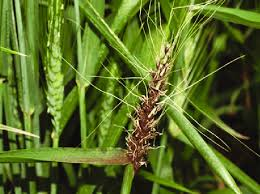

In [8]:
import random
from PIL import Image

# Set seed
random.seed(42)

# 1. Get all image paths (* means "any combination")
image_path_list = list(image_path.glob("*/*/*.png"))

# 2. Get random image path
random_image_path = random.choice(image_path_list)

# 3. Get image class from path name (the image class is the name of the directory where the image is stored)
image_class = random_image_path.parent.stem

# 4. Open image
img = Image.open(random_image_path)

# 5. Print metadata
print(f"Random image path: {random_image_path}")
print(f"Image class: {image_class}")
print(f"Image height: {img.height}")
print(f"Image width: {img.width}")
img

## 2. Transforming Data

Before we can use our image data with PyTorch we need to:

+ Turn it into tensors (numerical representations of our images).
+ Turn it into a `torch.utils.data.Dataset` and subsequently a `torch.utils.data.DataLoader`.

### 2.1 Transforming data with `torchvision.transforms`

**torchvision.transforms** contains many pre-built methods for formatting images, turning them into tensors and even manipulating them.

We will follow a series of transform steps:

* Resize the images using `transforms.Resize()` to a 255 x 255 image.
* Flip our images randomly on the horizontal using transforms.`RandomHorizontalFlip()` (performing data augmentation).
* Turn our images from a PIL image to a PyTorch tensor using `transforms.ToTensor()`.

We will compile all of these steps using torchvision.transforms.Compose().

In [9]:
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

# Write transform for image
data_transform = transforms.Compose([
    # Resize the images to 255 x 255
    transforms.Resize(size=(255, 255)),
    # Flip the images randomly on the horizontal
    transforms.RandomHorizontalFlip(p=0.5), # p = probability of flip, 0.5 = 50% chance
    # Turn the image into a torch.Tensor
    transforms.ToTensor(), # this also converts all pixel values from 0 to 255 to be between 0.0 and 1.0
])

Now we've got a composition of transforms, let's write a function to try them out on various images.

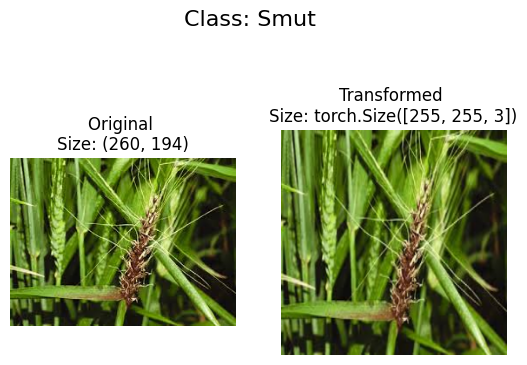

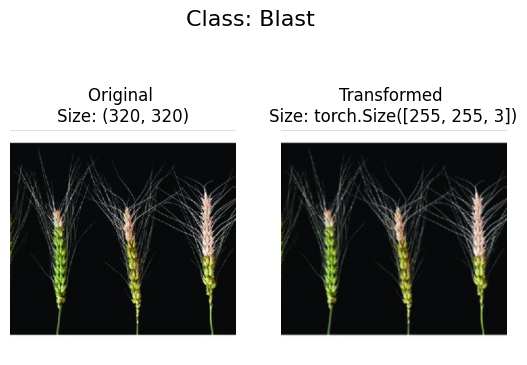

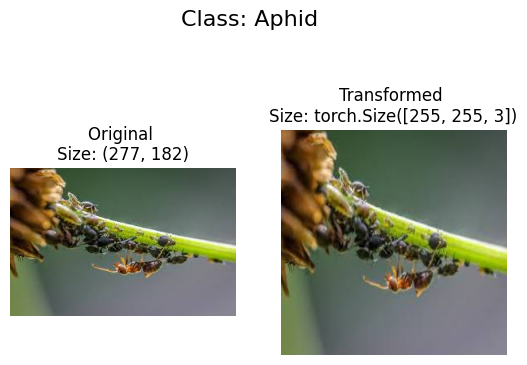

In [10]:
def plot_transformed_images(image_paths, transform, n=3, seed=42):
    """Plots a series of random images from image_paths.

    Will open n image paths from image_paths, transform them
    with transform and plot them side by side.

    Args:
        image_paths (list): List of target image paths.
        transform (PyTorch Transforms): Transforms to apply to images.
        n (int, optional): Number of images to plot. Defaults to 3.
        seed (int, optional): Random seed for the random generator. Defaults to 42.
    """
    random.seed(seed)
    random_image_paths = random.sample(image_paths, k=n)
    for image_path in random_image_paths:
        with Image.open(image_path) as f:
            fig, ax = plt.subplots(1, 2)
            ax[0].imshow(f)
            ax[0].set_title(f"Original \nSize: {f.size}")
            ax[0].axis("off")

            # Transform and plot image
            # Note: permute() will change shape of image to suit matplotlib
            # (PyTorch default is [C, H, W] but Matplotlib is [H, W, C])
            transformed_image = transform(f).permute(1, 2, 0)
            ax[1].imshow(transformed_image)
            ax[1].set_title(f"Transformed \nSize: {transformed_image.shape}")
            ax[1].axis("off")

            fig.suptitle(f"Class: {image_path.parent.stem}", fontsize=16)

plot_transformed_images(image_path_list,
                        transform=data_transform,
                        n=3)

## 3. Loading Image Data using `ImageFolder`

Since our data is in standard image classification format, we can use the class `torchvision.datasets.ImageFolder`.

In [11]:
# Use ImageFolder to create dataset(s)
from torchvision import datasets

train_data = datasets.ImageFolder(root=train_dir, # target folder of images
                                  transform=data_transform, # transforms to perform on data (images)
                                  target_transform=None) # transforms to perform on labels (if necessary)

test_data = datasets.ImageFolder(root=test_dir,
                                 transform=data_transform)

print(f"Train data:\n----------\n{train_data}\n")
print(f"Test data:\n----------\n{test_data}")

Train data:
----------
Dataset ImageFolder
    Number of datapoints: 13104
    Root location: /content/drive/MyDrive/Wheat-Disease-Classification/data/train
    StandardTransform
Transform: Compose(
               Resize(size=(255, 255), interpolation=bilinear, max_size=None, antialias=True)
               RandomHorizontalFlip(p=0.5)
               ToTensor()
           )

Test data:
----------
Dataset ImageFolder
    Number of datapoints: 300
    Root location: /content/drive/MyDrive/Wheat-Disease-Classification/data/valid
    StandardTransform
Transform: Compose(
               Resize(size=(255, 255), interpolation=bilinear, max_size=None, antialias=True)
               RandomHorizontalFlip(p=0.5)
               ToTensor()
           )


Now we have turned our data into PyTorch ImageFolder.

Let's inspect them by checking out the `classes` and `class_to_idx` attributes as well as the `lengths` of our training and test sets.

In [12]:
# Get class names as a list
class_names = train_data.classes
class_names

['Aphid',
 'Black Rust',
 'Blast',
 'Brown Rust',
 'Common Root Rot',
 'Fusarium Head Blight',
 'Healthy',
 'Leaf Blight',
 'Mildew',
 'Mite',
 'Septoria',
 'Smut',
 'Stem fly',
 'Tan spot',
 'Yellow Rust']

In [13]:
# Can also get class names as a dict
class_dict = train_data.class_to_idx
class_dict

{'Aphid': 0,
 'Black Rust': 1,
 'Blast': 2,
 'Brown Rust': 3,
 'Common Root Rot': 4,
 'Fusarium Head Blight': 5,
 'Healthy': 6,
 'Leaf Blight': 7,
 'Mildew': 8,
 'Mite': 9,
 'Septoria': 10,
 'Smut': 11,
 'Stem fly': 12,
 'Tan spot': 13,
 'Yellow Rust': 14}

In [14]:
# Check the lengths
len(train_data), len(test_data)

(13104, 300)

We can index on our train_data and test_data Dataset's to find samples and their target labels.

In [15]:
img, label = train_data[0][0], train_data[0][1]
print(f"Image tensor:\n{img}")
print(f"Image shape: {img.shape}")
print(f"Image datatype: {img.dtype}")
print(f"Image label: {label}")
print(f"Image label name: {class_names[label]}")
print(f"Label datatype: {type(label)}")

Image tensor:
tensor([[[0.7490, 0.6314, 0.6471,  ..., 0.6275, 0.6549, 0.5961],
         [0.7451, 0.6353, 0.6510,  ..., 0.6431, 0.6667, 0.5961],
         [0.7373, 0.6392, 0.6627,  ..., 0.6588, 0.6745, 0.5922],
         ...,
         [0.0784, 0.0902, 0.0980,  ..., 0.0824, 0.0980, 0.1255],
         [0.0784, 0.0863, 0.0863,  ..., 0.0627, 0.0863, 0.1020],
         [0.0706, 0.0784, 0.0745,  ..., 0.0471, 0.0510, 0.0627]],

        [[0.7765, 0.6627, 0.6784,  ..., 0.7098, 0.7451, 0.6902],
         [0.7725, 0.6667, 0.6824,  ..., 0.7255, 0.7529, 0.6863],
         [0.7647, 0.6706, 0.6941,  ..., 0.7333, 0.7529, 0.6745],
         ...,
         [0.1608, 0.1647, 0.1686,  ..., 0.0627, 0.0824, 0.1216],
         [0.1608, 0.1647, 0.1608,  ..., 0.0353, 0.0667, 0.0902],
         [0.1569, 0.1608, 0.1529,  ..., 0.0118, 0.0314, 0.0510]],

        [[0.6157, 0.5098, 0.5412,  ..., 0.5725, 0.6039, 0.5490],
         [0.6157, 0.5137, 0.5412,  ..., 0.5882, 0.6118, 0.5451],
         [0.6078, 0.5216, 0.5490,  ..., 0.60

### 3.1 Creating a helper function to get class names

In [16]:
# Make function to find classes in target directory
def find_classes(directory: str) -> Tuple[List[str], Dict[str, int]]:
    """Finds the class folder names in a target directory.

    Assumes target directory is in standard image classification format.

    Args:
        directory (str): target directory to load classnames from.

    Returns:
        Tuple[List[str], Dict[str, int]]: (list_of_class_names, dict(class_name: idx...))

    Example:
        find_classes("food_images/train")
        >>> (["class_1", "class_2"], {"class_1": 0, ...})
    """
    # 1. Get the class names by scanning the target directory
    classes = sorted(entry.name for entry in os.scandir(directory) if entry.is_dir())

    # 2. Raise an error if class names not found
    if not classes:
        raise FileNotFoundError(f"Couldn't find any classes in {directory}.")

    # 3. Create a dictionary of index labels (computers prefer numerical rather than string labels)
    class_to_idx = {cls_name: i for i, cls_name in enumerate(classes)}
    return classes, class_to_idx

In [ ]:
find_classes(train_dir)

(['Aphid',
  'Black Rust',
  'Blast',
  'Brown Rust',
  'Common Root Rot',
  'Fusarium Head Blight',
  'Healthy',
  'Leaf Blight',
  'Mildew',
  'Mite',
  'Septoria',
  'Smut',
  'Stem fly',
  'Tan spot',
  'Yellow Rust'],
 {'Aphid': 0,
  'Black Rust': 1,
  'Blast': 2,
  'Brown Rust': 3,
  'Common Root Rot': 4,
  'Fusarium Head Blight': 5,
  'Healthy': 6,
  'Leaf Blight': 7,
  'Mildew': 8,
  'Mite': 9,
  'Septoria': 10,
  'Smut': 11,
  'Stem fly': 12,
  'Tan spot': 13,
  'Yellow Rust': 14})

### 3.2 Subset the train data

As the `train_data` dataset contains 13,000+ images, so this requires alot of training time and computation time (around 8+ hours) so we will subset our dataset containing only 1500 images.

In [17]:
from torch.utils.data import DataLoader, Subset, SubsetRandomSampler

# Set random seed
torch.manual_seed(42)

# Define the desired subset size
subset_size = 1500

# Create a subset of the train dataset
subset_indices = torch.randperm(len(train_data))[:subset_size]
subset_train_data = Subset(train_data, subset_indices)

In [18]:
from collections import Counter

# Extract the labels for the subset
subset_labels = [train_data.targets[idx] for idx in subset_indices]

# Count the number of images per class
label_counts = Counter(subset_labels)

# Map class indices to class names
class_names = train_data.classes

# Print the counts of each class
for idx, count in label_counts.items():
    print(f'Class {class_names[idx]}: {count} images')

Class Common Root Rot: 75 images
Class Tan spot: 96 images
Class Septoria: 133 images
Class Healthy: 97 images
Class Mite: 103 images
Class Black Rust: 63 images
Class Brown Rust: 132 images
Class Yellow Rust: 153 images
Class Smut: 156 images
Class Fusarium Head Blight: 85 images
Class Mildew: 108 images
Class Blast: 82 images
Class Aphid: 116 images
Class Leaf Blight: 81 images
Class Stem fly: 20 images


### 3.3 Create a function to display random images

In [19]:
# 1. Take in a Dataset as well as a list of class names
def display_random_images(dataset: torch.utils.data.dataset.Dataset,
                          classes: List[str] = None,
                          n: int = 10,
                          display_shape: bool = True,
                          seed: int = None):

    # 2. Adjust display if n too high
    if n > 10:
        n = 10
        display_shape = False
        print(f"For display purposes, n shouldn't be larger than 10, setting to 10 and removing shape display.")

    # 3. Set random seed
    if seed:
        random.seed(seed)

    # 4. Get random sample indexes
    random_samples_idx = random.sample(range(len(dataset)), k=n)

    # 5. Setup plot
    plt.figure(figsize=(16, 8))

    # 6. Loop through samples and display random samples
    for i, targ_sample in enumerate(random_samples_idx):
        targ_image, targ_label = dataset[targ_sample][0], dataset[targ_sample][1]

        # 7. Adjust image tensor shape for plotting: [color_channels, height, width] -> [color_channels, height, width]
        targ_image_adjust = targ_image.permute(1, 2, 0)

        # Plot adjusted samples
        plt.subplot(1, n, i+1)
        plt.imshow(targ_image_adjust)
        plt.axis("off")
        if classes:
            title = f"class: {classes[targ_label]}"
            if display_shape:
                title = title + f"\nshape: {targ_image_adjust.shape}"
        plt.title(title)

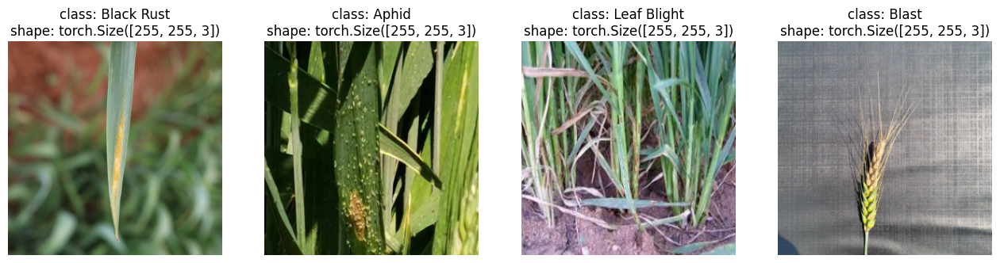

In [20]:
# Display random images from subset_train_data ImageFolder created Dataset
display_random_images(subset_train_data,
                      n=4,
                      classes=class_names,
                      seed=None)

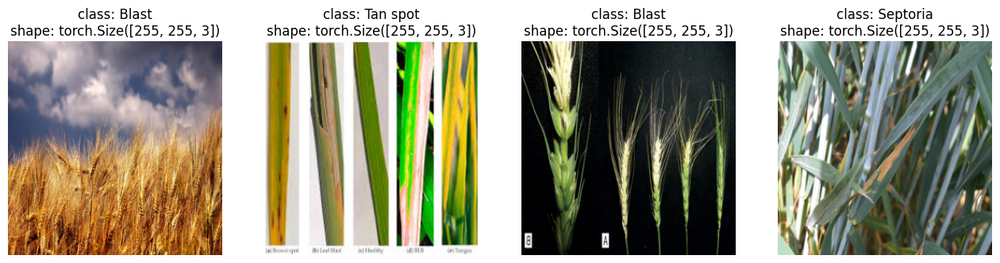

In [21]:
# Display random images from test ImageFolder created Dataset
display_random_images(test_data,
                      n=4,
                      classes=class_names,
                      seed=None)

### 3.4 Turn Loaded Images into `DataLoader`'s

Turning our Dataset's into DataLoader's makes them iterable so a model can go through learn the relationships between samples and targets (features and labels).

In [22]:
# Set batch size and number of workers
BATCH_SIZE = 32
NUM_WORKERS = os.cpu_count()

# Turn train and test Dataset's into DataLoader's
from torch.utils.data import DataLoader
train_dataloader = DataLoader(dataset=subset_train_data,
                              batch_size=BATCH_SIZE,
                              #num_workers=NUM_WORKERS, # no. of cores to be used for data loading
                              shuffle=True)

test_dataloader = DataLoader(dataset=test_data,
                            batch_size=BATCH_SIZE,
                            #num_workers=NUM_WORKERS,
                            shuffle=False)

# Let's check out what we've created
print(f"Dataloaders: {train_dataloader, test_dataloader}")
print(f"Length of train dataloader: {len(train_dataloader)} batches of {BATCH_SIZE}")
print(f"Length of test dataloader: {len(test_dataloader)} batches of {BATCH_SIZE}")

Dataloaders: (<torch.utils.data.dataloader.DataLoader object at 0x7dbb33c93af0>, <torch.utils.data.dataloader.DataLoader object at 0x7dbb33c93a30>)
Length of train dataloader: 47 batches of 32
Length of test dataloader: 10 batches of 32


## 4. Modeling


### 4.1 Create model class

In [23]:
class WheatDiseaseModel(nn.Module):
  def __init__(self) -> None:
      super().__init__()

      self.layer = nn.Sequential(
          nn.Conv2d(in_channels=3,
                    out_channels=32,
                    kernel_size=3,
                    padding=1),
          nn.ReLU(),
          nn.MaxPool2d(kernel_size=2,
                       stride=2),
          nn.Conv2d(in_channels=32,
                    out_channels=64,
                    kernel_size=3,
                    padding=1),
          nn.ReLU(),
          nn.MaxPool2d(kernel_size=2,
                       stride=2),
          nn.Flatten(),
      )

      self.classifier = nn.Sequential(
          nn.Linear(in_features=64*63*63,
                    out_features=64),
          nn.ReLU(),
          nn.Linear(in_features=64,
                    out_features=15),
          nn.Softmax(dim=1)
      )

  def forward(self, x):
    x = self.layer(x)
    x = self.classifier(x)
    return x

# Create an instance of the model
model = WheatDiseaseModel().to(device)

# Print the model architecture
print(model)

WheatDiseaseModel(
  (layer): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Flatten(start_dim=1, end_dim=-1)
  )
  (classifier): Sequential(
    (0): Linear(in_features=254016, out_features=64, bias=True)
    (1): ReLU()
    (2): Linear(in_features=64, out_features=15, bias=True)
    (3): Softmax(dim=1)
  )
)


###4.2 Try a forward pass on a single image (to test the model)

In [24]:
# 1. Get a batch of images and labels from the DataLoader
img_batch, label_batch = next(iter(train_dataloader))

# 2. Get a single image from the batch and unsqueeze the image so its shape fits the model
img_single, label_single = img_batch[0].unsqueeze(dim=0), label_batch[0]
print(f"Single image shape: {img_single.shape}\n")

# 3. Perform a forward pass on a single image
model.eval()
with torch.inference_mode():
    pred = model(img_single.to(device))

# 4. Print out what's happening and convert model logits -> pred probs -> pred label
print(f"Output logits:\n{pred}\n")
print(f"Output prediction probabilities:\n{torch.softmax(pred, dim=1)}\n")
print(f"Output prediction label:\n{torch.argmax(torch.softmax(pred, dim=1), dim=1)}\n")
print(f"Actual label:\n{label_single}")

Single image shape: torch.Size([1, 3, 255, 255])

Output logits:
tensor([[0.0697, 0.0583, 0.0728, 0.0656, 0.0724, 0.0709, 0.0679, 0.0607, 0.0723,
         0.0624, 0.0676, 0.0595, 0.0717, 0.0611, 0.0671]], device='cuda:0')

Output prediction probabilities:
tensor([[0.0669, 0.0661, 0.0671, 0.0666, 0.0670, 0.0670, 0.0667, 0.0663, 0.0670,
         0.0664, 0.0667, 0.0662, 0.0670, 0.0663, 0.0667]], device='cuda:0')

Output prediction label:
tensor([2], device='cuda:0')

Actual label:
4


### 4.3 Use `torchinfo` to get an idea of the shapes going through our model

In [25]:
# Install torchinfo if it's not available, import it if it is
try:
    import torchinfo
except:
    !pip install torchinfo
    import torchinfo

from torchinfo import summary
summary(model, input_size=[1, 3, 255, 255]) # do a test pass through of an example input size

Layer (type:depth-idx)                   Output Shape              Param #
WheatDiseaseModel                        [1, 15]                   --
├─Sequential: 1-1                        [1, 254016]               --
│    └─Conv2d: 2-1                       [1, 32, 255, 255]         896
│    └─ReLU: 2-2                         [1, 32, 255, 255]         --
│    └─MaxPool2d: 2-3                    [1, 32, 127, 127]         --
│    └─Conv2d: 2-4                       [1, 64, 127, 127]         18,496
│    └─ReLU: 2-5                         [1, 64, 127, 127]         --
│    └─MaxPool2d: 2-6                    [1, 64, 63, 63]           --
│    └─Flatten: 2-7                      [1, 254016]               --
├─Sequential: 1-2                        [1, 15]                   --
│    └─Linear: 2-8                       [1, 64]                   16,257,088
│    └─ReLU: 2-9                         [1, 64]                   --
│    └─Linear: 2-10                      [1, 15]                   975
│

### 4.4 Create train & test loop functions

In [26]:
def train_step(model: torch.nn.Module,
               dataloader: torch.utils.data.DataLoader,
               loss_fn: torch.nn.Module,
               optimizer: torch.optim.Optimizer):
    # Put model in train mode
    model.train()

    # Setup train loss and train accuracy values
    train_loss, train_acc = 0, 0

    # Loop through data loader data batches
    for batch, (X, y) in tqdm(enumerate(dataloader)):
        # Send data to target device
        X, y = X.to(device), y.to(device)

        # 1. Forward pass
        y_pred = model(X)

        # 2. Calculate  and accumulate loss
        loss = loss_fn(y_pred, y)
        train_loss += loss.item()

        # 3. Optimizer zero grad
        optimizer.zero_grad()

        # 4. Loss backward
        loss.backward()

        # 5. Optimizer step
        optimizer.step()

        # Calculate and accumulate accuracy metric across all batches
        y_pred_class = torch.argmax(torch.softmax(y_pred, dim=1), dim=1)
        train_acc += (y_pred_class == y).sum().item()/len(y_pred)

    # Adjust metrics to get average loss and accuracy per batch
    train_loss = train_loss / len(dataloader)
    train_acc = train_acc / len(dataloader)
    return train_loss, train_acc

In [27]:
def test_step(model: torch.nn.Module,
              dataloader: torch.utils.data.DataLoader,
              loss_fn: torch.nn.Module):
    # Put model in eval mode
    model.eval()

    # Setup test loss and test accuracy values
    test_loss, test_acc = 0, 0

    # Turn on inference context manager
    with torch.inference_mode():
        # Loop through DataLoader batches
        for batch, (X, y) in tqdm(enumerate(dataloader)):
            # Send data to target device
            X, y = X.to(device), y.to(device)

            # 1. Forward pass
            test_pred_logits = model(X)

            # 2. Calculate and accumulate loss
            loss = loss_fn(test_pred_logits, y)
            test_loss += loss.item()

            # Calculate and accumulate accuracy
            test_pred_labels = test_pred_logits.argmax(dim=1)
            test_acc += ((test_pred_labels == y).sum().item()/len(test_pred_labels))

    # Adjust metrics to get average loss and accuracy per batch
    test_loss = test_loss / len(dataloader)
    test_acc = test_acc / len(dataloader)
    return test_loss, test_acc

### 4.5 Adding TensorBoard and Model Training

In [28]:
from torch.utils.tensorboard import SummaryWriter

# 1. Take in various parameters required for training and test steps
def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module = nn.CrossEntropyLoss(),
          epochs: int = 5,
          log_dir: str = "/content/drive/MyDrive/Wheat-Disease-Classification/logs"):

    # Create a SummaryWriter object for TensorBoard
    writer = SummaryWriter(log_dir=log_dir)

    # 2. Create empty results dictionary
    results = {"train_loss": [],
        "train_acc": [],
        "test_loss": [],
        "test_acc": []
    }

    # 3. Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc = train_step(model=model,
                                           dataloader=train_dataloader,
                                           loss_fn=loss_fn,
                                           optimizer=optimizer)
        test_loss, test_acc = test_step(model=model,
            dataloader=test_dataloader,
            loss_fn=loss_fn)

        # 4. Print out what's happening
        print(
            f"Epoch: {epoch+1} | "
            f"train_loss: {train_loss:.4f} | "
            f"train_acc: {train_acc:.4f} | "
            f"test_loss: {test_loss:.4f} | "
            f"test_acc: {test_acc:.4f}"
        )

        # 5. Update results dictionary
        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)

        # Log to TensorBoard
        writer.add_scalar('Loss/train', train_loss, epoch)
        writer.add_scalar('Accuracy/train', train_acc, epoch)
        writer.add_scalar('Loss/test', test_loss, epoch)
        writer.add_scalar('Accuracy/test', test_acc, epoch)

    # Close the writer
    writer.close()

    # 6. Return the filled results at the end of the epochs
    return results

In [ ]:
# Set random seeds
torch.manual_seed(42)
torch.cuda.manual_seed(42)

# Set number of epochs
NUM_EPOCHS = 50

# Recreate an instance of TinyVGG
model_0 = WheatDiseaseModel().to(device)

# Setup loss function and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params=model_0.parameters(), lr=0.001)

# Start the timer
from timeit import default_timer as timer
start_time = timer()

# Train model_0
model_0_results = train(model=model_0,
                        train_dataloader=train_dataloader,
                        test_dataloader=test_dataloader,
                        optimizer=optimizer,
                        loss_fn=loss_fn,
                        epochs=NUM_EPOCHS)

# End the timer and print out how long it took
end_time = timer()
print(f"Total training time: {end_time-start_time:.3f} seconds")

  0%|          | 0/50 [00:00<?, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 1 | train_loss: 2.6978 | train_acc: 0.1005 | test_loss: 2.6546 | test_acc: 0.1781


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 2 | train_loss: 2.6129 | train_acc: 0.2077 | test_loss: 2.6249 | test_acc: 0.1792


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 3 | train_loss: 2.5766 | train_acc: 0.2282 | test_loss: 2.6088 | test_acc: 0.2000


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 4 | train_loss: 2.5472 | train_acc: 0.2666 | test_loss: 2.6280 | test_acc: 0.1812


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 5 | train_loss: 2.5309 | train_acc: 0.2826 | test_loss: 2.5488 | test_acc: 0.2594


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 6 | train_loss: 2.5053 | train_acc: 0.3090 | test_loss: 2.5592 | test_acc: 0.2531


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 7 | train_loss: 2.4997 | train_acc: 0.3132 | test_loss: 2.5530 | test_acc: 0.2531


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 8 | train_loss: 2.4626 | train_acc: 0.3538 | test_loss: 2.5398 | test_acc: 0.2656


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 9 | train_loss: 2.4321 | train_acc: 0.3841 | test_loss: 2.5315 | test_acc: 0.2812


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 10 | train_loss: 2.3999 | train_acc: 0.4206 | test_loss: 2.5063 | test_acc: 0.3094


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 11 | train_loss: 2.3752 | train_acc: 0.4426 | test_loss: 2.5128 | test_acc: 0.2938


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 12 | train_loss: 2.3582 | train_acc: 0.4594 | test_loss: 2.5722 | test_acc: 0.2437


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 13 | train_loss: 2.3570 | train_acc: 0.4646 | test_loss: 2.5328 | test_acc: 0.2812


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 14 | train_loss: 2.3146 | train_acc: 0.5020 | test_loss: 2.5331 | test_acc: 0.2781


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 15 | train_loss: 2.2866 | train_acc: 0.5392 | test_loss: 2.4991 | test_acc: 0.3125


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 16 | train_loss: 2.2560 | train_acc: 0.5672 | test_loss: 2.4877 | test_acc: 0.3250


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 17 | train_loss: 2.2457 | train_acc: 0.5740 | test_loss: 2.4707 | test_acc: 0.3438


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 18 | train_loss: 2.2201 | train_acc: 0.6013 | test_loss: 2.4784 | test_acc: 0.3344


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 19 | train_loss: 2.2037 | train_acc: 0.6152 | test_loss: 2.5013 | test_acc: 0.3156


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 20 | train_loss: 2.2028 | train_acc: 0.6184 | test_loss: 2.4708 | test_acc: 0.3469


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 21 | train_loss: 2.1896 | train_acc: 0.6286 | test_loss: 2.4745 | test_acc: 0.3375


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 22 | train_loss: 2.1892 | train_acc: 0.6287 | test_loss: 2.4652 | test_acc: 0.3469


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 23 | train_loss: 2.1798 | train_acc: 0.6345 | test_loss: 2.4664 | test_acc: 0.3438


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 24 | train_loss: 2.1731 | train_acc: 0.6420 | test_loss: 2.4857 | test_acc: 0.3156


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 25 | train_loss: 2.1692 | train_acc: 0.6494 | test_loss: 2.4689 | test_acc: 0.3438


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 26 | train_loss: 2.1670 | train_acc: 0.6506 | test_loss: 2.4698 | test_acc: 0.3469


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 27 | train_loss: 2.1611 | train_acc: 0.6572 | test_loss: 2.4651 | test_acc: 0.3469


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 28 | train_loss: 2.1629 | train_acc: 0.6545 | test_loss: 2.4950 | test_acc: 0.3156


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 29 | train_loss: 2.1574 | train_acc: 0.6581 | test_loss: 2.4837 | test_acc: 0.3281


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 30 | train_loss: 2.1418 | train_acc: 0.6740 | test_loss: 2.4692 | test_acc: 0.3344


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 31 | train_loss: 2.1495 | train_acc: 0.6665 | test_loss: 2.4806 | test_acc: 0.3312


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 32 | train_loss: 2.1485 | train_acc: 0.6657 | test_loss: 2.4829 | test_acc: 0.3312


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 33 | train_loss: 2.1416 | train_acc: 0.6720 | test_loss: 2.4646 | test_acc: 0.3531


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 34 | train_loss: 2.1306 | train_acc: 0.6862 | test_loss: 2.4566 | test_acc: 0.3531


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 35 | train_loss: 2.1299 | train_acc: 0.6858 | test_loss: 2.4730 | test_acc: 0.3500


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 36 | train_loss: 2.1271 | train_acc: 0.6877 | test_loss: 2.4478 | test_acc: 0.3656


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 37 | train_loss: 2.1226 | train_acc: 0.6926 | test_loss: 2.4681 | test_acc: 0.3469


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 38 | train_loss: 2.1287 | train_acc: 0.6868 | test_loss: 2.4729 | test_acc: 0.3344


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 39 | train_loss: 2.1279 | train_acc: 0.6869 | test_loss: 2.4717 | test_acc: 0.3375


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 40 | train_loss: 2.1212 | train_acc: 0.6948 | test_loss: 2.4759 | test_acc: 0.3344


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 41 | train_loss: 2.1175 | train_acc: 0.6960 | test_loss: 2.4811 | test_acc: 0.3312


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 42 | train_loss: 2.1175 | train_acc: 0.6961 | test_loss: 2.4888 | test_acc: 0.3187


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 43 | train_loss: 2.1226 | train_acc: 0.6915 | test_loss: 2.4825 | test_acc: 0.3281


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 44 | train_loss: 2.1137 | train_acc: 0.7017 | test_loss: 2.4685 | test_acc: 0.3469


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 45 | train_loss: 2.1160 | train_acc: 0.6986 | test_loss: 2.4638 | test_acc: 0.3531


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 46 | train_loss: 2.1139 | train_acc: 0.7002 | test_loss: 2.4505 | test_acc: 0.3625


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 47 | train_loss: 2.1125 | train_acc: 0.7000 | test_loss: 2.4490 | test_acc: 0.3625


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 48 | train_loss: 2.1085 | train_acc: 0.7040 | test_loss: 2.4540 | test_acc: 0.3594


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 49 | train_loss: 2.1100 | train_acc: 0.7021 | test_loss: 2.4545 | test_acc: 0.3563


0it [00:00, ?it/s]

0it [00:00, ?it/s]

Epoch: 50 | train_loss: 2.1073 | train_acc: 0.7055 | test_loss: 2.4644 | test_acc: 0.3438
Total training time: 15131.290 seconds


### 4.6 TensorBoard for `WheatDiseaseModel()`

In [33]:
%load_ext tensorboard
%tensorboard --logdir "/content/drive/MyDrive/Wheat-Disease-Classification/logs"

<IPython.core.display.Javascript object>

### 4.7 Training Summary and Observations

#### Model Training Time and Accuracy

+ Training Duration: 4.12 hours
+ Training Accuracy: 7%


#### Factors Influencing Accuracy

+ Dataset Size: A large dataset significantly increased training time.
+ Image Resolution: High resolution (255x255 pixels) retained essential features for wheat disease detection but also increased computational load and training time.

#### Constraints and Challenges

+ Training Time: Training even a reduced dataset of 1500 images took over 4 hours. Training on the entire dataset would take more than 24 hours, hindering quick iterations and hyperparameter tuning.
+ Computational Resources: High computational costs limited experimentation with different model architectures, hyperparameters, and other optimizations within a reasonable timeframe.

## 5. Saving and Loading Model

In [ ]:
from pathlib import Path

# Create models directory (if it doesn't already exist), see: https://docs.python.org/3/library/pathlib.html#pathlib.Path.mkdir
MODEL_PATH = Path("models")
MODEL_PATH.mkdir(parents=True, # create parent directories if needed
                 exist_ok=True # if models directory already exists, don't error
)

# Create model save path
MODEL_NAME = "model_0.pth"
MODEL_SAVE_PATH = MODEL_PATH / MODEL_NAME

# Save the model state dict
print(f"Saving model to: {MODEL_SAVE_PATH}")
torch.save(obj=model_0.state_dict(), # only saving the state_dict() only saves the learned parameters
           f=MODEL_SAVE_PATH)

Saving model to: models/model_0.pth


In [29]:
# Create a new instance of WheatDiseaseModel() to load in the saved staet dict
loaded_model_0 = WheatDiseaseModel()

# Load in the saved state_dict()
loaded_model_0.load_state_dict(torch.load(f="/content/drive/MyDrive/Wheat-Disease-Classification/model_0.pth"))

# Send model to GPU
loaded_model_0 = loaded_model_0.to(device)

In [30]:
# Calculate accuracy (a classification metric)
def accuracy_fn(y_true, y_pred):
    correct = torch.eq(y_true, y_pred).sum().item() # torch.eq() calculates where two tensors are equal
    acc = (correct / len(y_pred)) * 100
    return acc

## 6. Making Predictions

In [34]:
def make_predictions(model: torch.nn.Module, data: list, device: torch.device = device):
    pred_probs = []
    model.eval()
    with torch.inference_mode():
        for sample in data:
            # Prepare sample
            sample = torch.unsqueeze(sample, dim=0).to(device) # Add an extra dimension and send sample to device

            # Forward pass (model outputs raw logit)
            pred_logit = model(sample)

            # Get prediction probability (logit -> prediction probability)
            pred_prob = torch.softmax(pred_logit.squeeze(), dim=0) # note: perform softmax on the "logits" dimension, not "batch" dimension (in this case we have a batch size of 1, so can perform on dim=0)

            # Get pred_prob off GPU for further calculations
            pred_probs.append(pred_prob.cpu())

    # Stack the pred_probs to turn list into a tensor
    return torch.stack(pred_probs)

In [35]:
import random
random.seed(42)

test_samples = []
test_labels = []
for sample, label in random.sample(list(test_data), k=9):
    test_samples.append(sample)
    test_labels.append(label)

# View the first test sample shape and label
print(f"Test sample image shape: {test_samples[0].shape}\nTest sample label: {test_labels[0]} ({class_names[test_labels[0]]})")

Test sample image shape: torch.Size([3, 255, 255])
Test sample label: 2 (Blast)


In [36]:
# Make predictions on test samples with model 2
pred_probs= make_predictions(model=loaded_model_0,
                             data=test_samples)

# View first two prediction probabilities list
pred_probs[:2]

tensor([[0.0598, 0.0598, 0.1618, 0.0598, 0.0598, 0.0599, 0.0598, 0.0598, 0.0598,
         0.0599, 0.0598, 0.0601, 0.0598, 0.0598, 0.0598],
        [0.1624, 0.0598, 0.0598, 0.0598, 0.0598, 0.0598, 0.0598, 0.0598, 0.0598,
         0.0598, 0.0598, 0.0599, 0.0598, 0.0598, 0.0598]])

In [37]:
# Turn the prediction probabilities into prediction labels by taking the argmax()
pred_classes = pred_probs.argmax(dim=1)
pred_classes

tensor([ 2,  0,  3, 14,  5,  9,  2,  2,  9])

In [38]:
# Are our predictions in the same form as our test labels?
test_labels, pred_classes

([2, 0, 7, 6, 5, 3, 2, 13, 2], tensor([ 2,  0,  3, 14,  5,  9,  2,  2,  9]))

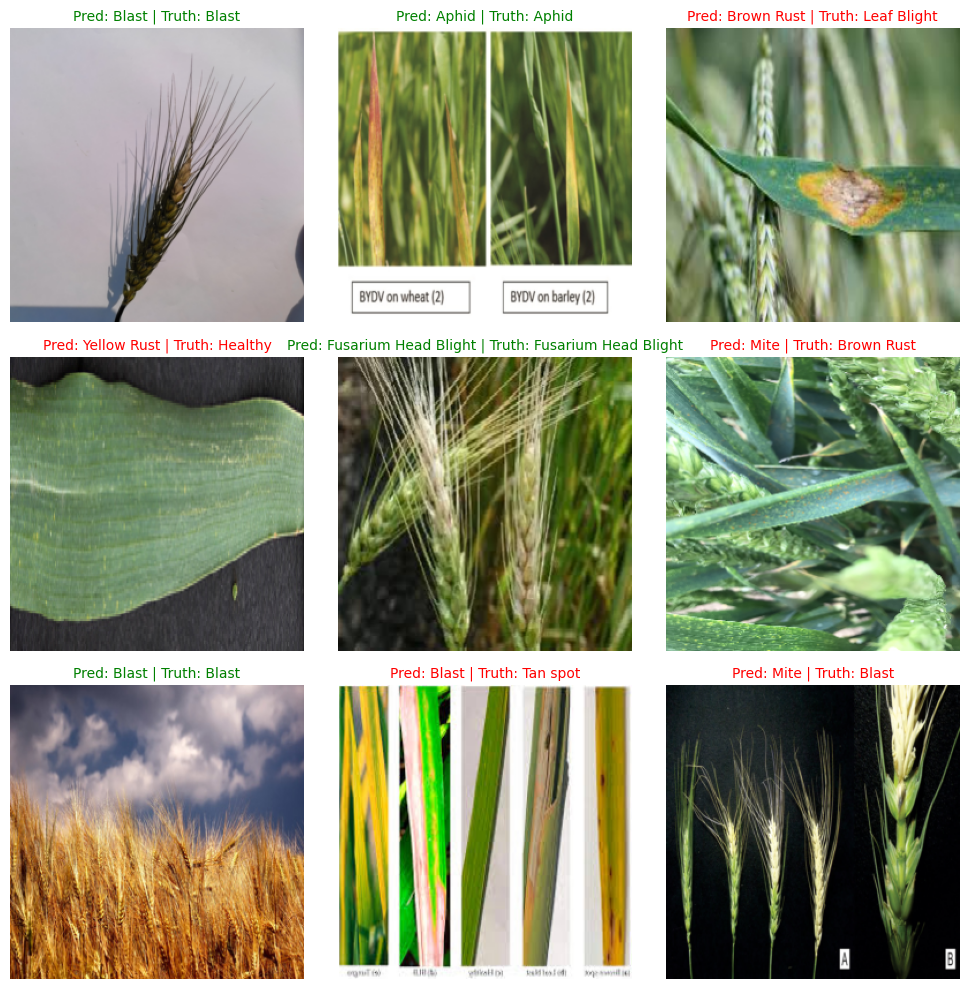

In [43]:
plt.figure(figsize=(10, 10))
nrows = 3
ncols = 3
for i, sample in enumerate(test_samples):
    # Create a subplot
    plt.subplot(nrows, ncols, i + 1)

    # Transpose the sample to have channels last
    sample = sample.permute(1, 2, 0)

    # Plot the target image
    plt.imshow(sample.squeeze(), cmap="gray")

    # Find the prediction label (in text form, e.g. "Sandal")
    pred_label = class_names[pred_classes[i]]

    # Get the truth label (in text form, e.g. "T-shirt")
    truth_label = class_names[test_labels[i]]

    # Create the title text of the plot
    title_text = f"Pred: {pred_label} | Truth: {truth_label}"

    # Check for equality and change title color accordingly
    if pred_label == truth_label:
        plt.title(title_text, fontsize=10, color="g")  # green text if correct
    else:
        plt.title(title_text, fontsize=10, color="r")  # red text if wrong

    plt.axis('off')

plt.tight_layout()
plt.show()

## 7. Ploting Confusion Matrix

In [44]:
# See if torchmetrics exists, if not, install it
try:
    import torchmetrics, mlxtend
    print(f"mlxtend version: {mlxtend.__version__}")
    assert int(mlxtend.__version__.split(".")[1]) >= 19, "mlxtend verison should be 0.19.0 or higher"
except:
    !pip install -q torchmetrics -U mlxtend
    import torchmetrics, mlxtend
    print(f"mlxtend version: {mlxtend.__version__}")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 868.8/868.8 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 14.8 MB/s eta 0:00:00
mlxtend version: 0.23.1


In [45]:
# Import mlxtend upgraded version
import mlxtend
print(mlxtend.__version__)
assert int(mlxtend.__version__.split(".")[1]) >= 19 # should be version 0.19.0 or higher

0.23.1


In [47]:
# Import tqdm for progress bar
from tqdm.auto import tqdm

# 1. Make predictions with trained model
y_preds = []
loaded_model_0.eval()
with torch.inference_mode():
  for X, y in tqdm(test_dataloader, desc="Making predictions"):
    # Send data and targets to target device
    X, y = X.to(device), y.to(device)
    # Do the forward pass
    y_logit = loaded_model_0(X)
    # Turn predictions from logits -> prediction probabilities -> predictions labels
    y_pred = torch.softmax(y_logit, dim=1).argmax(dim=1)
    # Put predictions on CPU for evaluation
    y_preds.append(y_pred.cpu())
# Concatenate list of predictions into a tensor
y_pred_tensor = torch.cat(y_preds)

Making predictions:   0%|          | 0/10 [00:00<?, ?it/s]

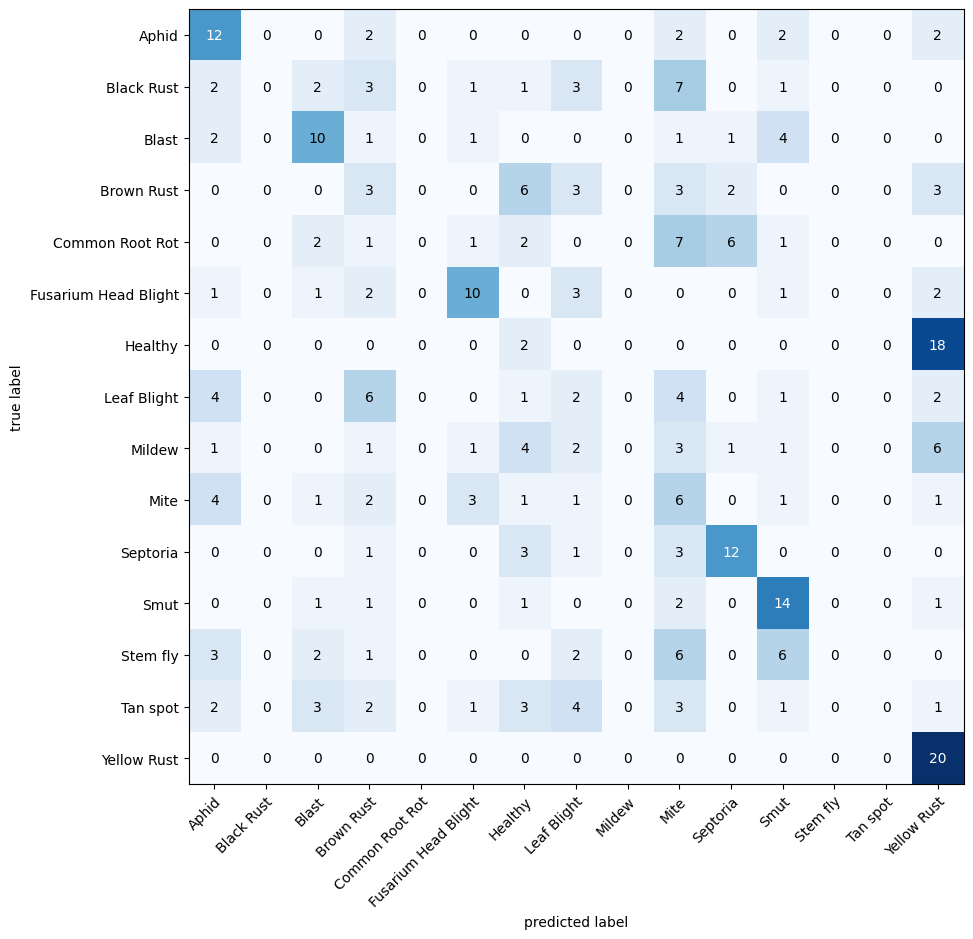

In [51]:
from torchmetrics import ConfusionMatrix
from mlxtend.plotting import plot_confusion_matrix

# Ensure y_pred_tensor and test_data.targets are tensors
y_pred_tensor = torch.tensor(y_pred_tensor) if not isinstance(y_pred_tensor, torch.Tensor) else y_pred_tensor
test_data.targets = torch.tensor(test_data.targets) if not isinstance(test_data.targets, torch.Tensor) else test_data.targets

# Setup confusion matrix instance and compare predictions to targets
confmat = ConfusionMatrix(num_classes=len(class_names), task='multiclass')
confmat_tensor = confmat(preds=y_pred_tensor, target=test_data.targets)

# Convert the confusion matrix tensor to numpy for plotting
confmat_np = confmat_tensor.cpu().numpy()

# Plot the confusion matrix
fig, ax = plot_confusion_matrix(
    conf_mat=confmat_np, # matplotlib likes working with NumPy
    class_names=class_names, # turn the row and column labels into class names
    figsize=(10, 15)
)
plt.show()

In [55]:
import torch
import torchvision
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
from typing import List

def pred_and_plot_image(model: torch.nn.Module,
                        image_path: str,
                        class_names: List[str] = None,
                        transform=None,
                        device: torch.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")):
    """Makes a prediction on a target image and plots the image with its prediction."""

    # 1. Load in image and convert it to a PIL image
    target_image = Image.open(image_path).convert("RGB")

    # 2. Transform if necessary
    if transform:
        target_image = transform(target_image)

    # 3. Divide the image pixel values by 255 to get them between [0, 1] (if not already done by transform)
    if target_image.max() > 1:
        target_image = target_image / 255.0

    # 4. Make sure the model is on the target device
    model.to(device)

    # 5. Turn on model evaluation mode and inference mode
    model.eval()
    with torch.inference_mode():
        # Add an extra dimension to the image
        target_image = target_image.unsqueeze(dim=0)

        # Make a prediction on image with an extra dimension and send it to the target device
        target_image_pred = model(target_image.to(device))

    # 6. Convert logits -> prediction probabilities (using torch.softmax() for multi-class classification)
    target_image_pred_probs = torch.softmax(target_image_pred, dim=1)

    # 7. Convert prediction probabilities -> prediction labels
    target_image_pred_label = torch.argmax(target_image_pred_probs, dim=1)

    # 8. Plot the image alongside the prediction and prediction probability
    plt.imshow(target_image.squeeze().permute(1, 2, 0).cpu()) # make sure it's the right size for matplotlib
    if class_names:
        title = f"Pred: {class_names[target_image_pred_label.cpu().item()]} | Prob: {target_image_pred_probs.max().cpu().item():.3f}"
    else:
        title = f"Pred: {target_image_pred_label.cpu().item()} | Prob: {target_image_pred_probs.max().cpu().item():.3f}"
    plt.title(title)
    plt.axis(False)
    plt.show()

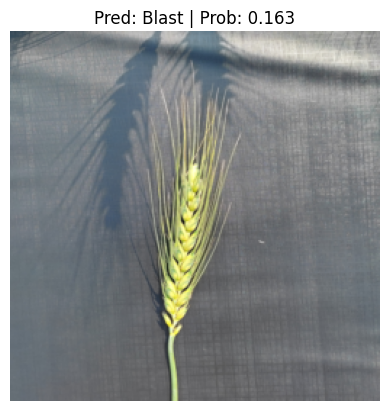

In [58]:
# Ploting predictions for a blast wheat disease image
pred_and_plot_image(model=loaded_model_0,
                    image_path="/content/blast_5.png",
                    class_names=class_names,
                    transform=data_transform,
                    device=device)